# Traffic Sign Recognition

The Dataset: 

# Initialization

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import pathlib
import os
import timeit
import itertools
import datetime

# Keras
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.activations import relu, softmax
from tensorflow.keras.models import Model
# enabling support for SHAP

# metrics
import tensorflow_addons as tfa 

# cv2
import cv2

# sklearn
from sklearn.metrics import confusion_matrix

# MLOps
import wandb
from wandb.keras import WandbCallback

#XAI
import shap
import keras.backend as K

No supported GPU was found.


In [2]:
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]

# General Parameters

In [3]:
# get num of classes
def get_num_classes(path):
    num_cats = 0
    for fname in os.listdir(path):
        try:
            bool = type(int(fname)) is int
            num_cats +=1
        except:
            pass
    return num_cats

In [4]:
# location of the data
base_dir = './dataset/GTSRB'
train_dir = './dataset/GTSRB/Train'
test_dir = './dataset/GTSRB/Test'

# dataset metadata
train_meta = './dataset/GTSRB/Train.csv'
test_meta = './dataset/GTSRB/Test.csv'

## Helper Functions

In [5]:
def plot_results(history, simple_style=False):
    # Results analysis:
    if simple_style:
        losses = pd.DataFrame(history.history, columns=['loss', 'val_loss'])
        accuracies = pd.DataFrame(history.history, columns=['acc', 'val_acc'])
        losses.plot()
        accuracies.plot()
    else:
        acc = history.history['acc']
        val_acc = history.history['val_acc']
        loss = history.history['loss']
        val_loss = history.history['val_loss']

        epochs = range(1, len(acc) + 1)

        plt.plot(epochs, acc, color='blue', label='Training acc')
        plt.plot(epochs, val_acc, color='gray', label='Validation acc')
        plt.title('Training and validation accuracy')
        plt.legend()
        plt.figure()

        plt.plot(epochs, loss, 'b', color='blue', label='Training loss')
        plt.plot(epochs, val_loss, 'b', color='gray', label='Validation loss')
        plt.title('Training and validation loss')
        plt.legend()

        plt.show()

# plots images with labels within jupyter notebook
# source: https://github.com/fastai/courses/blob/master/deeplearning1/nbs/utils.py#L79

def plots(ims, figsize=(12,6), rows=1, interp=False, titles=None):
    if type(ims[0]) is np.ndarray:
        ims = np.array(ims).astype(np.uint8)
        if (ims.shape[-1] != 3):
            ims = ims.transpose((0,2,3,1))
    f = plt.figure(figsize=figsize)
    cols = len(ims)//rows if len(ims) % 2 == 0 else len(ims)//rows + 1
    for i in range(len(ims)):
        sp = f.add_subplot(rows, cols, i+1)
        sp.axis('Off')
        if titles is not None:
            sp.set_title(titles[i], fontsize=16)
        plt.imshow(ims[i], interpolation=None if interp else 'none')

# plot Confusion Matrix
# source: https://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html#sphx-glr-auto-examples-model-selection-plot-confusion-matrix-py

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    return plt

# plot a test image

def get_input_img(sign_class, img_height, img_width, index = 0, dataset='Test'):
    def reshape_img(img):
        img = cv2.resize(img, (img_height,img_width))
        return np.expand_dims(img, axis=0)

    if dataset == 'Train':
        file_path = base_dir + '/Train/' + str(sign_class) + '/'
        file_name = os.listdir(file_path)[index]
        img = cv2.imread(file_path + file_name)
    
    if dataset == 'Test':
        meta = pd.read_csv('./dataset/GTSRB/Test.csv')
        file = meta[meta['ClassId'] == sign_class]['Path'].values[index]
        img = cv2.imread(base_dir + '/' + file)        

    plt.figure(figsize=(3,3))
    plt.imshow(img)
    return reshape_img(img)
        

def plot_feature_maps(model, img):
    successive_outputs = [layer.output for layer in model.layers[1:]]
    inputs = model.inputs
    outputs = successive_outputs
    filters = Model(inputs=inputs, outputs=outputs)
    feature_maps = filters.predict(img)
    layer_names = [layer.name for layer in model.layers]
    for layer_name, feature_map in zip(layer_names, feature_maps):
        print(feature_map.shape)
        if len(feature_map.shape) == 4:
            # Plot Feature maps for the conv / maxpool layers, not the fully-connected layers
            n_features = feature_map.shape[-1]  # number of features in the feature map
            size = feature_map.shape[ 1]  # feature map shape (1, size, size, n_features)
            # We will tile our images in this matrix
            display_grid = np.zeros((size, size * n_features))
            
            for i in range(n_features):
                x = feature_map[0, :, :, i]
                x -= x.mean()
                x /= x.std()
                x *= 64
                x += 128
                x = np.clip(x, 0, 255).astype('uint8')
                display_grid[:, i * size : (i + 1) * size] = x

            #Display the grid
            scale = 20. / n_features
            plt.figure( figsize=(scale * n_features, scale) )
            plt.title ( layer_name )
            plt.grid  ( False )
            plt.imshow( display_grid, aspect='auto', cmap='viridis' )

# plot kernel weights

def plotFilters(conv_filter):
    fig, axes = plt.subplots(1, 3, figsize=(5,5))
    axes = axes.flatten()
    for img, ax in zip( conv_filter, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

def show_filters (model):
    for layer in model.layers:
        if 'conv' in layer.name:
            weights, bias= layer.get_weights()
            #print(layer.name, filters.shape)
            
            #normalize filter values between  0 and 1 for visualization
            f_min, f_max = weights.min(), weights.max()
            filters = (weights - f_min) / (f_max - f_min)  
            print(filters.shape[3])
            filter_cnt=1
            
            #plotting all the filters
            for i in range(filters.shape[3]):
                #get the filters
                filt=filters[:,:,:, i]
                #plotting each of the channel, color image RGB channels
                for j in range(filters.shape[0]):
                    ax= plt.subplot(filters.shape[3], filters.shape[0], filter_cnt  )
                    ax.set_xticks([])
                    ax.set_yticks([])
                    plt.imshow(filt[:, j])
                    filter_cnt+=1
            plt.show()  

## MLOps

Weights an Biases init

In [6]:
!wandb login

wandb: Currently logged in as: gaspia (use `wandb login --relogin` to force relogin)


In [7]:
#Generic dataset parameters
img_width, img_height = 48, 48
batch_size = 256
cat_num = get_num_classes(train_dir)

# Dataset exploration and preprocessing

## Simple Keras based data augmentation

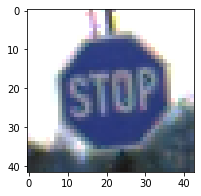

In [8]:
# loading an image sample
img = get_input_img(sign_class=14, img_height=img_height, img_width=img_width, index=31, dataset='Train')

def plot_augmented_samples (batch):
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(10,10))
    # generate batch of images
    for i in range(3):
	    # convert to unsigned integers
	    image = next(aug_iter)[0].astype('uint8')
	    # plot image
	    ax[i].imshow(image)
	    ax[i].axis('off')
    

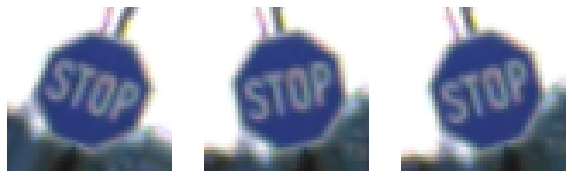

In [9]:
# image rotation
datagen = ImageDataGenerator(rotation_range=30, fill_mode='nearest')
# iterator
aug_iter = datagen.flow(img, batch_size=1)
plot_augmented_samples(aug_iter)

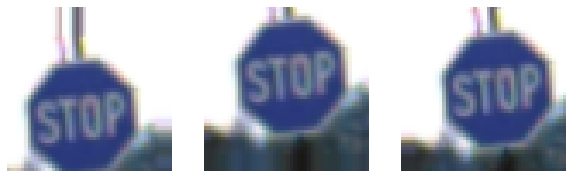

In [10]:
# height and width of the image
datagen = ImageDataGenerator(width_shift_range=.2, 
        height_shift_range=.2,
        fill_mode='nearest'
        )
# iterator
aug_iter = datagen.flow(img, batch_size=1)
plot_augmented_samples(aug_iter)

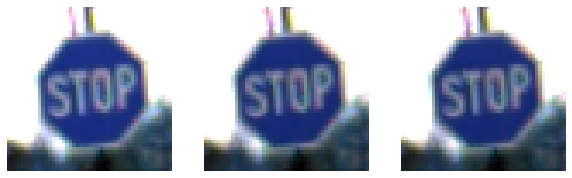

In [11]:
# brightness
datagen = ImageDataGenerator(brightness_range=[1,1.2])
# iterator
aug_iter = datagen.flow(img, batch_size=1)
plot_augmented_samples(aug_iter)

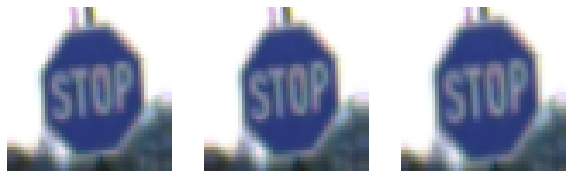

In [12]:
# zoom
datagen = ImageDataGenerator(zoom_range=0.2)  # zoom
# iterator
aug_iter = datagen.flow(img, batch_size=1)
plot_augmented_samples(aug_iter)

This ImageDataGenerator specifies `zca_whitening`, which overrides setting of `featurewise_center`.
This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.


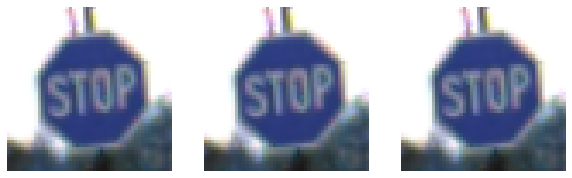

In [13]:
# ZCA whitening
datagen = ImageDataGenerator(zca_whitening=True)  # zoom
# iterator
aug_iter = datagen.flow(img, batch_size=1)
plot_augmented_samples(aug_iter)

NOTE:
- We opt not to use zoom as it will distort the sign shapes
- We also opt not to horizontal and vertical flips and signs have directional information which would be lost

Found 27447 images belonging to 43 classes.


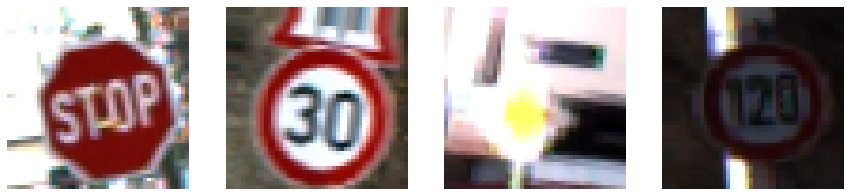

In [14]:
# dry running the generator and fine-tunning the parameters

train_datagen = ImageDataGenerator(validation_split=0.3, 
    # we will not use vertical/horizontal flip as signs have directional information that is revelant
    # adding a img rotation of up to 20º
    rotation_range=10,
    # adding a img translation of up to 20% of the image size - We found some issues with the fill mode = 'nearest'
    width_shift_range=.1, 
    height_shift_range=.1,
    fill_mode='nearest',
    # adding a brightness range of 1 to 1.2 - after visual inspection
    brightness_range=[1,1.2]
    # zoom
    #zoom_range=0.2,
    #zca_whitening
    )
        
train_generator = train_datagen.flow_from_directory(
    train_dir,
    subset='training',
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode='rgb',    
    shuffle=True,
    class_mode='categorical'
    )

# plotting a sample from the training dataset
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(15,15))
for i in range(4):

  # convert to unsigned integers for plotting
  image = next(train_generator)[0].astype('uint8')

  # changing size from (1, 200, 200, 3) to (200, 200, 3) for plotting the image
  image = np.squeeze(image[0])

  # plot raw pixel data
  ax[i].imshow(image)
  ax[i].axis('off')


In [15]:
# training dataset
# With Keras data augmentation

def get_train_val_data(train_dir, img_width, img_height, batch_size, seed):
        #training dataset
    train_datagen = ImageDataGenerator(validation_split=0.3, 
        # we will not use vertical/horizontal flip as signs have directional information that is revelant
        # adding a img rotation of up to 20º
        rotation_range=10,
        # adding a img translation of up to 20% of the image size - We found some issues with the fill mode = 'nearest'
        width_shift_range=.1, 
        height_shift_range=.1,
        fill_mode='nearest',
        # adding a brightness range of 1 to 1.2 - after visual inspection
        brightness_range=[1,1.2],
        # zoom
        #zoom_range=0.2,
        rescale=1./255)
        
    train_generator = train_datagen.flow_from_directory(
        train_dir,
        subset='training',
        target_size=(img_width,img_height),
        batch_size=batch_size,
        color_mode='rgb',    
        shuffle=True,
        seed=seed,
        class_mode='categorical')

    # validation dataset
    val_generator = train_datagen.flow_from_directory(
        train_dir,
        subset='validation',
        target_size=(img_width,img_height),
        batch_size=batch_size,
        color_mode='rgb',    
        seed=seed,
        class_mode='categorical'
        )

    return train_generator, val_generator

def get_test_data(test_dir, labels_path, img_width, img_height, batch_size):
    #test dataset
    test_datagen = ImageDataGenerator(
        rescale=1./255,
        brightness_range=[1,1.2]
        )
    
    test_generator = test_datagen.flow_from_dataframe(
        dataframe = pd.read_csv(labels_path, dtype=str),
        directory = test_dir,
        x_col = 'Path',
        y_col = 'ClassId',
        target_size=(img_width,img_height),
        batch_size=batch_size,
        color_mode='rgb',
        class_mode='categorical',
        shuffle=False
        )
    
    return test_generator

In [16]:
train_generator, val_generator = get_train_val_data(train_dir, img_width, img_height, batch_size, seed=1)

Found 27447 images belonging to 43 classes.
Found 11762 images belonging to 43 classes.


In [17]:
test_generator = get_test_data(base_dir, test_meta, img_width, img_height, batch_size)

Found 12630 validated image filenames belonging to 43 classes.


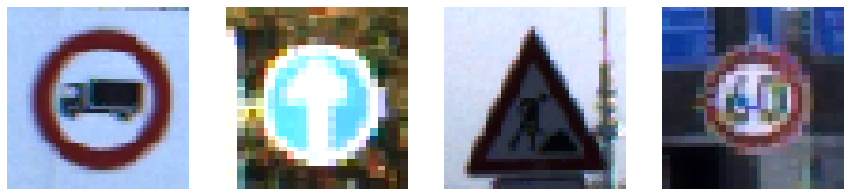

In [18]:
# plotting a sample from the training dataset
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(15,15))
for i in range(4):

  # convert to unsigned integers for plotting
  image = next(test_generator)[0]

  # changing size from (1, 200, 200, 3) to (200, 200, 3) for plotting the image
  image = np.squeeze(image[0])

  # plot raw pixel data
  ax[i].imshow(image)
  ax[i].axis('off')

In [19]:
print('Batches train=%d, test=%d' % (len(train_generator), len(test_generator)))

Batches train=108, test=50


In [20]:
# getting some test images for XAI
X, y = next(test_generator)
to_explain = X[20:30]


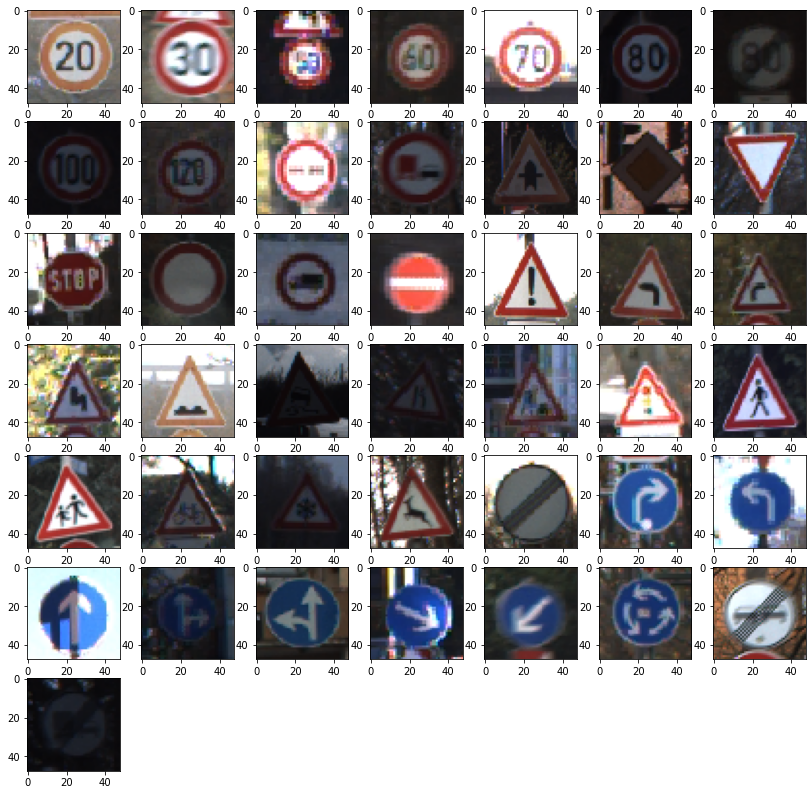

In [21]:
# Visualizing all the different Signs
img_dir = pathlib.Path(train_dir)
plt.figure(figsize=(14,14))
index = 0
for i in range(cat_num):
    plt.subplot(7, 7, i+1)
    plt.grid(False)
    sign = list(img_dir.glob(f'{i}/*'))[0]
    img = load_img(sign, target_size=(img_width, img_height))
    plt.imshow(img)
plt.show()

## Class Distribution

In [22]:
# Label Overview
classes = { 0:'Speed limit (20km/h)',
            1:'Speed limit (30km/h)', 
            2:'Speed limit (50km/h)', 
            3:'Speed limit (60km/h)', 
            4:'Speed limit (70km/h)', 
            5:'Speed limit (80km/h)', 
            6:'End of speed limit (80km/h)', 
            7:'Speed limit (100km/h)', 
            8:'Speed limit (120km/h)', 
            9:'No passing', 
            10:'No passing veh over 3.5 tons', 
            11:'Right-of-way at intersection', 
            12:'Priority road', 
            13:'Yield', 
            14:'Stop', 
            15:'No vehicles', 
            16:'Veh > 3.5 tons prohibited', 
            17:'No entry', 
            18:'General caution', 
            19:'Dangerous curve left', 
            20:'Dangerous curve right', 
            21:'Double curve', 
            22:'Bumpy road', 
            23:'Slippery road', 
            24:'Road narrows on the right', 
            25:'Road work', 
            26:'Traffic signals', 
            27:'Pedestrians', 
            28:'Children crossing', 
            29:'Bicycles crossing', 
            30:'Beware of ice/snow',
            31:'Wild animals crossing', 
            32:'End speed + passing limits', 
            33:'Turn right ahead', 
            34:'Turn left ahead', 
            35:'Ahead only', 
            36:'Go straight or right', 
            37:'Go straight or left', 
            38:'Keep right', 
            39:'Keep left', 
            40:'Roundabout mandatory', 
            41:'End of no passing', 
            42:'End no passing veh > 3.5 tons' }

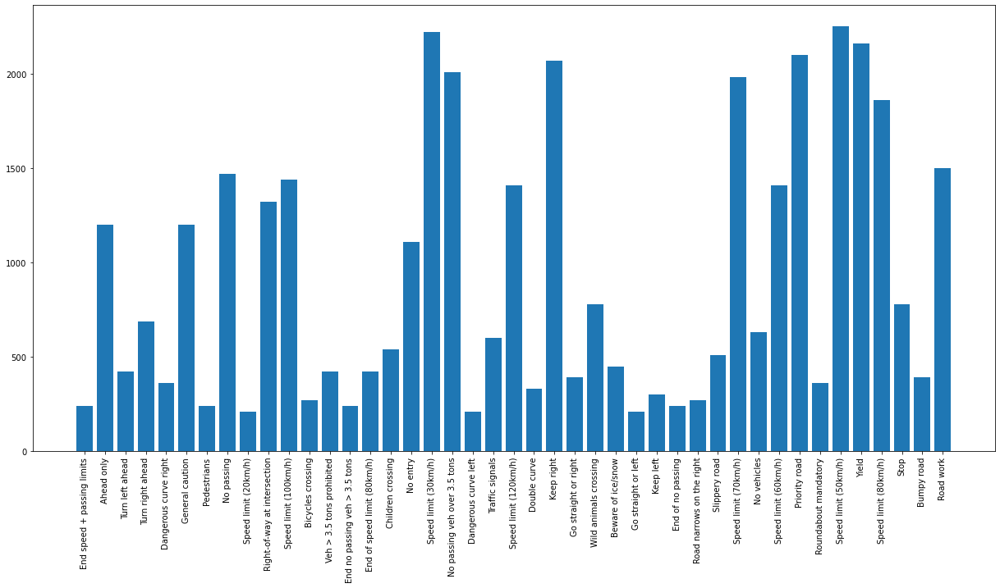

In [23]:
# determining the training data distribution per category
folders = next(os.walk(train_dir))[1]

train_number = []
class_num = []

for folder in folders:
    train_files = os.listdir(train_dir + '/' + folder)
    train_number.append(len(train_files))
    class_num.append(classes[int(folder)])

plt.figure(figsize=(21,10))  
plt.bar(class_num, train_number)
plt.xticks(class_num, rotation='vertical')
plt.show()

In [24]:
# Calculating the weights to compensate for the class imbalance
from sklearn.utils import class_weight
class_weights = class_weight.compute_class_weight(
        class_weight='balanced', classes=np.unique(train_generator.classes), y=train_generator.classes)

class_weights = dict(zip(np.unique(train_generator.classes), class_weights))
class_weights

{0: 4.342192691029901,
 1: 0.4107479572595852,
 2: 0.45366192294342245,
 3: 0.6908033826638478,
 4: 0.43421926910299,
 5: 0.4221576227390181,
 6: 1.1690518783542039,
 7: 1.4473975636766334,
 8: 2.1710963455149503,
 9: 0.8214959145191704,
 10: 0.7598837209302326,
 11: 4.342192691029901,
 12: 0.40527131782945736,
 13: 2.5329457364341086,
 14: 2.763213530655391,
 15: 2.3381037567084078,
 16: 1.7879616963064295,
 17: 3.3772609819121446,
 18: 0.607906976744186,
 19: 1.5197674418604652,
 20: 3.7994186046511627,
 21: 1.6886304909560723,
 22: 3.3772609819121446,
 23: 0.6467095497278575,
 24: 2.026356589147287,
 25: 1.1690518783542039,
 26: 3.7994186046511627,
 27: 1.321536905965622,
 28: 2.1710963455149503,
 29: 0.7598837209302326,
 30: 2.3381037567084078,
 31: 4.342192691029901,
 32: 0.44051230198854063,
 33: 3.0395348837209304,
 34: 0.4605355884425652,
 35: 2.5329457364341086,
 36: 3.7994186046511627,
 37: 3.7994186046511627,
 38: 0.49024756189047264,
 39: 2.1710963455149503,
 40: 0.63323643

## Analysis of the dataset

1. We can tell the image size is 
2. Some of the images have issues with low lighting / contrast / saturation which may become a problem for the model
3. The data is highly unbalanced

# Model Architectures

## Generic Paramters

In [24]:
# mlops
mlops_config = {
    "batch_size": batch_size,
    "img_width": img_width,
    "img_height": img_height,
    "cat_num": cat_num,
    "class_weights": True
}

## Baseline

The first CNN we are going to build consists on the following: 
1. A Convolutional layer followed by a MaxPooling layer; 
2. A second Convolutional layer followed by another MaxPooling layer; 
3. A Flatten layer (this is the input layer for the fully connected part of the CNN); 
4. A Dense Layer (this is the first hidden layer for the fully connected part of the CNN)
5. A second Dense layer (this is the output layer for the fully connected part of the CNN).
<br>

Please be mindful regarding the details below:
- The first and second Convolutional layers should contain 32 neurons (filters), with a filter of size 3x3 and an input shape of 64x64x3;
- The first and second MaxPooling layer should have a size of 2x2;
- The first Dense layer should have 128 neurons and the activation function should be the relu, while the second Dense layer should contain 1 neuron and the softmax as the activation function.

In [64]:
baseline_model = Sequential()
# Refference: DLNN lecture week 6
baseline_model.add(Conv2D(filters=32, kernel_size = (3, 3), strides = (1,1), activation = relu, padding = 'valid', input_shape=(img_width, img_height, 3)))
baseline_model.add(MaxPooling2D(pool_size=(2, 2)))
baseline_model.add(Conv2D(filters=32, kernel_size = (3, 3), strides = (1,1), activation = relu, padding = 'valid'))
baseline_model.add(MaxPooling2D(pool_size=(2, 2)))
# MLP - input layer
baseline_model.add(Flatten())
# MLP - hidden layer
baseline_model.add(Dense(units=128, activation=relu))
# MLP - output layer
baseline_model.add(Dense(units=43, activation=softmax))

# Check built model:
baseline_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 46, 46, 32)        896       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 23, 23, 32)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 21, 21, 32)        9248      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 10, 10, 32)       0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 3200)              0         
                                                                 
 dense_2 (Dense)             (None, 128)              

### Training And Evaluating The Model

In [26]:
# adding f1-score
import tensorflow_addons as tfa 

f1 = tfa.metrics.F1Score(num_classes=cat_num, average='weighted' or 'macro' or 'samples')

In [27]:
from tensorflow.keras import optimizers 
# adding a tunned Adam optimizer with learning rate = 0.001 as a tunnable HYP
opt = Adam(learning_rate=0.01)

baseline_model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['acc', f1])

In [28]:
# Common attributes:
mlops_config['steps_per_epoch'] = 5
mlops_config['epochs'] = 100
mlops_config['validation_steps'] = 20
mlops_config['loss'] = 'categorical_crossentropy'
mlops_config['optimizer'] = 'adam'
mlops_config['metrics'] = ['acc', 'f1']

In [29]:
from tensorflow.keras.callbacks import EarlyStopping

mlops_config['patience'] = 8
early_stopping = EarlyStopping (patience=mlops_config['patience'], monitor='val_loss', mode='min', restore_best_weights=True)

In [30]:
# MLOps init and callback
run_id = 'TS_baseline_' + str(datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
run = wandb.init(name=run_id , project='CNN_TS', config=mlops_config)

start = timeit.default_timer()

history_baseline = baseline_model.fit(
    train_generator,
    steps_per_epoch=mlops_config['steps_per_epoch'],
    validation_data=val_generator,
    validation_steps=mlops_config['validation_steps'],
    epochs=mlops_config['epochs'],
    class_weight=class_weights,
    callbacks=[WandbCallback(save_graph=True, input_type='image', labels=classes),early_stopping])

stop = timeit.default_timer()
print('Time Elapsed: ', stop - start)
wandb.log({'time-elapsed': stop - start})

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: gaspia (use `wandb login --relogin` to force relogin)


No supported GPU was found.
Epoch 1/100
5/5 [==============================] - 39s 9s/step - loss: 4.2728 - acc: 0.0461 - f1_score: 0.0242 - val_loss: 3.7352 - val_acc: 0.0205 - val_f1_score: 0.0047
Epoch 2/100
5/5 [==============================] - 35s 8s/step - loss: 3.8415 - acc: 0.0328 - f1_score: 0.0130 - val_loss: 3.7555 - val_acc: 0.0463 - val_f1_score: 0.0076
Epoch 3/100
5/5 [==============================] - 34s 8s/step - loss: 3.6796 - acc: 0.0352 - f1_score: 0.0066 - val_loss: 3.7439 - val_acc: 0.0270 - val_f1_score: 0.0062
Epoch 4/100
5/5 [==============================] - 37s 9s/step - loss: 3.9239 - acc: 0.0312 - f1_score: 0.0118 - val_loss: 3.7228 - val_acc: 0.0377 - val_f1_score: 0.0173
Epoch 5/100
5/5 [==============================] - 35s 8s/step - loss: 3.7273 - acc: 0.0352 - f1_score: 0.0246 - val_loss: 3.6311 - val_acc: 0.0531 - val_f1_score: 0.0298
Epoch 6/100
5/5 [==============================] - 35s 8s/step - loss: 3.6043 - acc: 0.0539 - f1_score: 0.0347 - val_

In [31]:
baseline_model.save('./models/TS_baseline_model.h5')

color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.


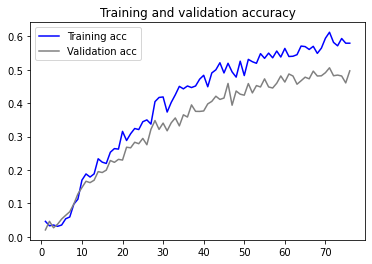

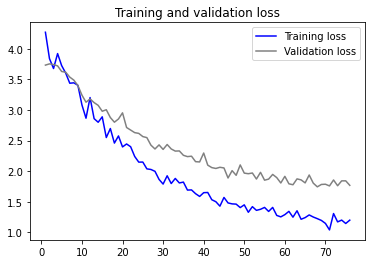

In [32]:
plot_results(history_baseline)

Confusion matrix, without normalization
[[ 12  40   0 ...   0   0   0]
 [ 62 383   0 ...  11  37   2]
 [  0   7 314 ...  46  25   4]
 ...
 [  4   8   1 ... 228 100   1]
 [ 21  15   0 ...  70 222   0]
 [  0   7  25 ...   4  10 340]]


<module 'matplotlib.pyplot' from '/usr/local/Caskroom/miniforge/base/envs/tf-macos/lib/python3.8/site-packages/matplotlib/pyplot.py'>

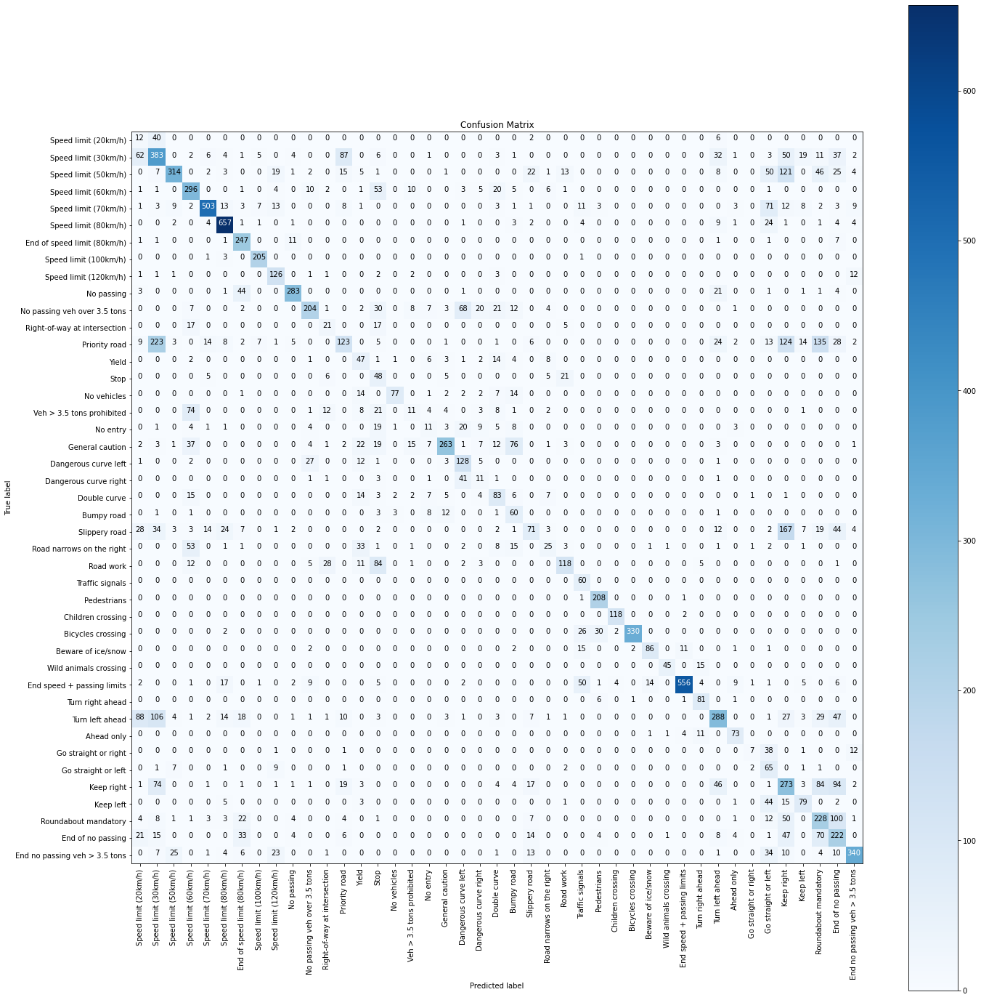

In [33]:
# predictions on Test data

Y_pred = baseline_model.predict(test_generator, steps=len(test_generator))
y_pred = np.argmax(Y_pred, axis=1)

# Confusion Matrix
cm = confusion_matrix(test_generator.classes, y_pred)

fig, ax = plt.subplots(figsize=(20, 20))
plot_confusion_matrix(cm=cm, classes=list(classes.values()), title='Confusion Matrix')

In [34]:
from sklearn import metrics
print(metrics.classification_report(y_pred, test_generator.classes, target_names=list(classes.values())))


                               precision    recall  f1-score   support

         Speed limit (20km/h)       0.20      0.05      0.08       237
         Speed limit (30km/h)       0.53      0.42      0.47       909
         Speed limit (50km/h)       0.48      0.85      0.61       370
         Speed limit (60km/h)       0.70      0.56      0.62       530
         Speed limit (70km/h)       0.73      0.90      0.81       557
         Speed limit (80km/h)       0.91      0.86      0.89       762
  End of speed limit (80km/h)       0.91      0.63      0.75       390
        Speed limit (100km/h)       0.98      0.91      0.94       226
        Speed limit (120km/h)       0.84      0.64      0.72       198
                   No passing       0.79      0.89      0.83       319
 No passing veh over 3.5 tons       0.52      0.75      0.62       273
 Right-of-way at intersection       0.35      0.28      0.31        75
                Priority road       0.16      0.45      0.24       276
     

In [35]:
#uploading artifacts to MLOps
fig.savefig('./confusion_matrix.png')
report = metrics.classification_report(y_pred, test_generator.classes, target_names=list(classes.values()), output_dict=True)
report = pd.DataFrame(report).T
df_report = wandb.Table(data=report)

artifact = wandb.Artifact(run_id, type='Confusion Matrix', description='Test Results')
artifact.add_file('confusion_matrix.png')
artifact.add(df_report, name='Test F1 Scores')
run.log_artifact(artifact)

In [36]:
run.finish()

acc,▁▁▁▁▂▃▃▄▃▄▅▄▅▅▅▆▅▆▆▆▆▆▇▇▇▇▇▇▇▇██▇██▇████
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
f1_score,▁▁▁▁▂▃▃▃▄▄▄▄▅▅▅▆▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇█▇██▇████
loss,█▇▇▇▆▅▆▅▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▁▂▂▁▁▁▁▁▁▁▁▁▁▁
time-elapsed,▁
val_acc,▁▁▁▂▂▃▃▄▄▄▄▅▅▅▅▅▅▆▆▇▆▇▇▇▆▇▇▇▇▇▇█████████
val_f1_score,▁▁▁▂▂▃▃▄▄▄▄▅▅▅▅▆▅▆▆▆▆▇▇▇▇▇▇▇▇▇█▇████████
val_loss,████▇▆▆▆▅▅▅▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▂▂▁▁▂▁▁▁▁▁
acc,0.57969
best_epoch,67
best_val_loss,1.74428


Shape before entering the conv layer: (1, 48, 48, 3)


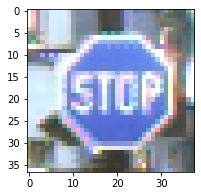

In [41]:
# plotting feature maps
img = get_input_img(14, img_width, img_height, 3, 'Test')
print ('Shape before entering the conv layer:', img.shape)

(1, 23, 23, 32)
(1, 21, 21, 32)
(1, 10, 10, 32)
(1, 3200)
(1, 128)
(1, 43)


invalid value encountered in true_divide


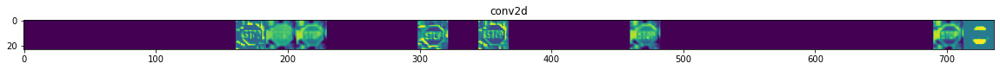

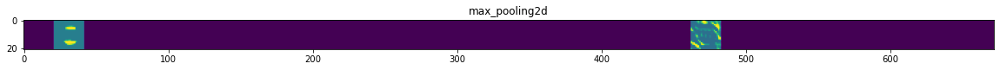

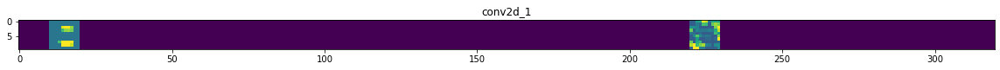

In [42]:
plot_feature_maps(baseline_model, img)

In [82]:
explainer = shap.GradientExplainer(baseline_model, X)
# we explain the model's predictions on the first three samples of the test set
shap_values = explainer.shap_values(to_explain)

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


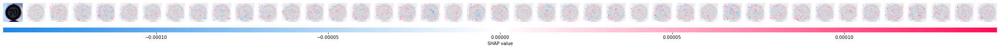

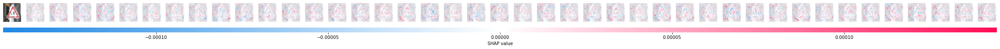

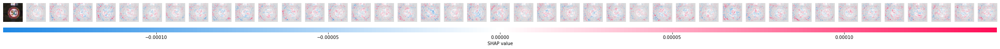

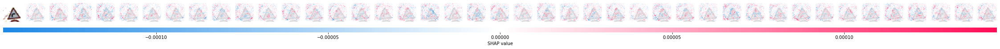

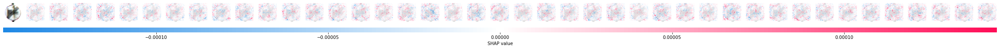

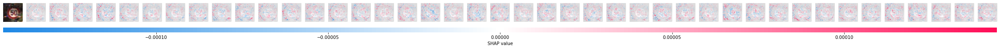

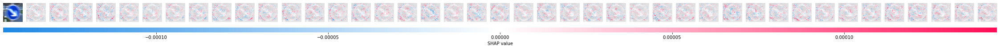

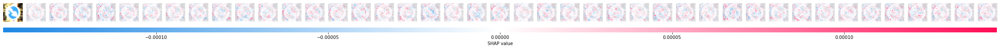

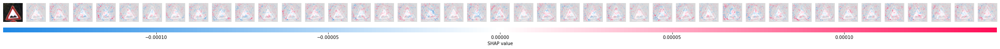

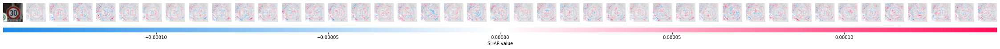

[None, None, None, None, None, None, None, None, None, None]

In [109]:
# here we plot the explanations for all classes for the first input (this is the feed forward input)
[shap.image_plot([shap_values[i][0] for i in range(42)], img, width=40) for img in to_explain]


## 7 layer model

Refference: Masci, et al "A committee of neural networks for traffic sign classification" [1]

In [25]:
masci_model = Sequential()
# Refference: DLNN lecture week 6
masci_model.add(Conv2D(filters=32, kernel_size = (3, 3), strides = (1,1), activation = relu, padding = 'valid', input_shape=(img_width, img_height, 3)))
masci_model.add(MaxPooling2D(pool_size=(2, 2)))
masci_model.add(Conv2D(filters=32, kernel_size = (4, 4), strides = (1,1), activation = relu, padding = 'valid'))
masci_model.add(MaxPooling2D(pool_size=(2, 2)))
masci_model.add(Conv2D(filters=32, kernel_size = (3, 3), strides = (1,1), activation = relu, padding = 'valid'))
masci_model.add(MaxPooling2D(pool_size=(2, 2)))
# MLP - input layer
masci_model.add(Flatten())
# MLP - hidden layer
masci_model.add(Dense(units=200, activation=relu))
# MLP - output layer
masci_model.add(Dense(units=43, activation=softmax))

# Check built model:
masci_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 23, 23, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 20, 20, 32)        16416     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 10, 10, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 8, 8, 32)          9248      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 4, 4, 32)         0

2022-01-15 15:35:27.618463: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [26]:
# adding f1-score
from tensorflow.keras import optimizers 
import tensorflow_addons as tfa 

f1 = tfa.metrics.F1Score(num_classes=cat_num, average='weighted' or 'macro' or 'samples')

# adding a tunned Adam optimizer with learning rate = 0.001 as a tunnable HYP
opt = Adam(learning_rate=0.01)

masci_model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['acc', f1])

In [27]:
# Common attributes:
# mlops
mlops_config = {
    "batch_size": batch_size,
    "img_width": img_width,
    "img_height": img_height,
    "cat_num": cat_num,
    "class_weights": True
}

mlops_config['steps_per_epoch'] = 5
mlops_config['epochs'] = 100
mlops_config['validation_steps'] = 20
mlops_config['loss'] = 'categorical_crossentropy'
mlops_config['optimizer'] = 'adam'
mlops_config['learning_rate'] = 0.01,
mlops_config['metrics'] = ['acc', f1]

In [28]:
from tensorflow.keras.callbacks import EarlyStopping

mlops_config['patience'] = 15
early_stopping = EarlyStopping (patience=mlops_config['patience'], monitor='val_loss', mode='min', restore_best_weights=True)

In [35]:
# MLOps init and callback
run_id = 'TS_masci' + str(datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
run = wandb.init(name=run_id , project='CNN_TS', config=mlops_config)

start = timeit.default_timer()

history_masci_model = masci_model.fit(
    train_generator,
    steps_per_epoch=mlops_config['steps_per_epoch'],
    validation_data=val_generator,
    validation_steps=mlops_config['validation_steps'],
    epochs=mlops_config['epochs'],
    class_weight=class_weights,
    callbacks=[WandbCallback(save_graph=True, input_type='image', labels=classes),early_stopping])

stop = timeit.default_timer()
print('Time Elapsed: ', stop - start)
wandb.log({'time-elapsed': stop - start})



acc,█▂▁▃▃▂▃▂▁▂▂▂▂▁▂▁
epoch,▁▁▂▂▃▃▄▄▅▅▆▆▇▇██
f1_score,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss,█▃▂▁▂▂▂▂▂▁▂▂▁▁▂▂
time-elapsed,▁
val_acc,▄▂█▂▃▁▃▂▃▁▂▂▂▃▁▂
val_f1_score,▃▁█▂▂▁▂▂▂▁▂▂▁▂▁▁
val_loss,▁▆▇██▇▄▃▄▂▁▂▃▂▂▂
acc,0.00391
best_epoch,0
best_val_loss,3.75916


No supported GPU was found.
Epoch 1/100
5/5 [==============================] - 42s 10s/step - loss: 3.7347 - acc: 0.0094 - f1_score: 1.7415e-04 - val_loss: 3.7589 - val_acc: 0.0080 - val_f1_score: 6.6497e-04
Epoch 2/100
5/5 [==============================] - 59s 14s/step - loss: 3.8844 - acc: 0.0063 - f1_score: 0.0012 - val_loss: 3.7600 - val_acc: 0.0221 - val_f1_score: 0.0040
Epoch 3/100
5/5 [==============================] - 50s 10s/step - loss: 3.8401 - acc: 0.0055 - f1_score: 5.2878e-04 - val_loss: 3.7599 - val_acc: 0.0088 - val_f1_score: 9.5244e-04
Epoch 4/100
5/5 [==============================] - 41s 10s/step - loss: 3.5082 - acc: 0.0281 - f1_score: 0.0100 - val_loss: 3.7421 - val_acc: 0.0357 - val_f1_score: 0.0065
Epoch 5/100
5/5 [==============================] - 33s 8s/step - loss: 3.6943 - acc: 0.0437 - f1_score: 0.0199 - val_loss: 3.6103 - val_acc: 0.0586 - val_f1_score: 0.0236
Epoch 6/100
5/5 [==============================] - 38s 9s/step - loss: 3.4529 - acc: 0.0445 - f1_

In [39]:
masci_model.save('./models/TS_masci_model.h5')

color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.


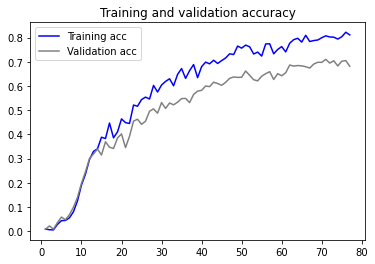

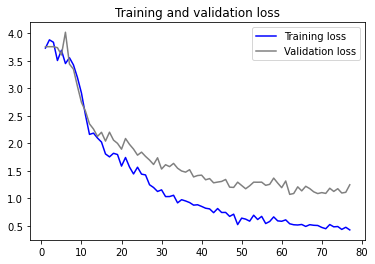

In [37]:
plot_results(history_masci_model)

Confusion matrix, without normalization
[[  0  21   0 ...   0  34   0]
 [ 12 354   0 ...   4 100   0]
 [  0   0 613 ...   1   6   0]
 ...
 [  0  13   2 ... 208 150   0]
 [  1  16   0 ...  43 338   0]
 [  0   0   9 ...   0   2 454]]


<module 'matplotlib.pyplot' from '/usr/local/Caskroom/miniforge/base/envs/tf-macos/lib/python3.8/site-packages/matplotlib/pyplot.py'>

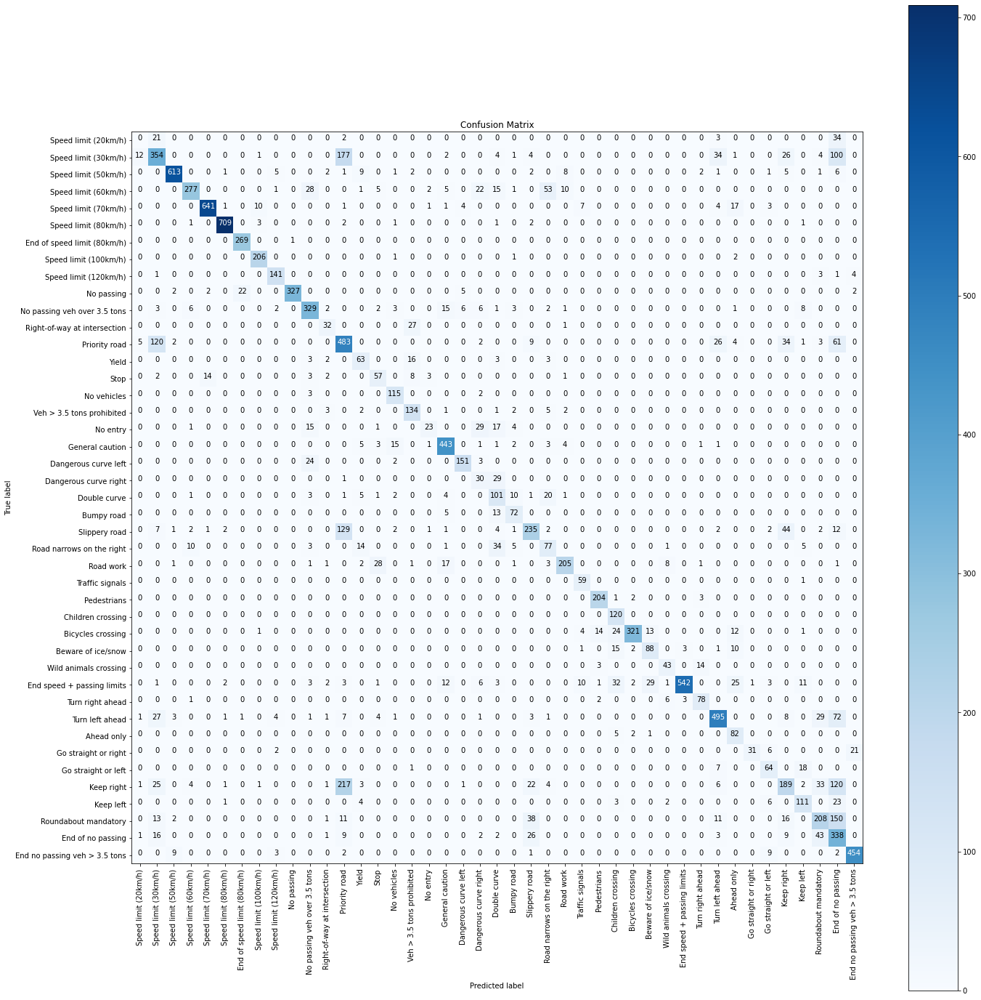

In [38]:
# predictions on Test data

Y_pred = masci_model.predict(test_generator, steps=len(test_generator))
y_pred = np.argmax(Y_pred, axis=1)

# Confusion Matrix
cm = confusion_matrix(test_generator.classes, y_pred)

fig, ax = plt.subplots(figsize=(20, 20))
plot_confusion_matrix(cm=cm, classes=list(classes.values()), title='Confusion Matrix')

In [40]:
from sklearn import metrics
print(metrics.classification_report(y_pred, test_generator.classes, target_names=list(classes.values())))

                               precision    recall  f1-score   support

         Speed limit (20km/h)       0.00      0.00      0.00        20
         Speed limit (30km/h)       0.49      0.60      0.54       590
         Speed limit (50km/h)       0.93      0.97      0.95       633
         Speed limit (60km/h)       0.66      0.91      0.77       303
         Speed limit (70km/h)       0.93      0.97      0.95       658
         Speed limit (80km/h)       0.98      0.99      0.99       718
  End of speed limit (80km/h)       1.00      0.92      0.96       292
        Speed limit (100km/h)       0.98      0.93      0.95       222
        Speed limit (120km/h)       0.94      0.89      0.92       158
                   No passing       0.91      1.00      0.95       328
 No passing veh over 3.5 tons       0.84      0.79      0.82       416
 Right-of-way at intersection       0.53      0.64      0.58        50
                Priority road       0.64      0.46      0.54      1046
     

In [41]:
#uploading artifacts to MLOps
fig.savefig('./confusion_matrix.png')
report = metrics.classification_report(y_pred, test_generator.classes, target_names=list(classes.values()), output_dict=True)
report = pd.DataFrame(report).T
df_report = wandb.Table(data=report)

artifact = wandb.Artifact(run_id, type='Confusion Matrix', description='Test Results')
artifact.add_file('confusion_matrix.png')
artifact.add(df_report, name='Test F1 Scores')
run.log_artifact(artifact)

Shape before entering the conv layer: (1, 48, 48, 3)


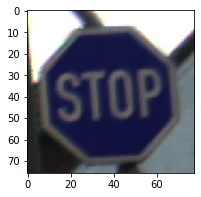

In [42]:
# plotting feature maps
img = get_input_img(14, img_width, img_height, 30, 'Test')
print ('Shape before entering the conv layer:', img.shape)

(1, 23, 23, 32)
(1, 20, 20, 32)
(1, 10, 10, 32)
(1, 8, 8, 32)
(1, 4, 4, 32)
(1, 512)
(1, 200)
(1, 43)


invalid value encountered in true_divide


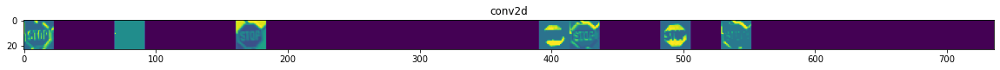

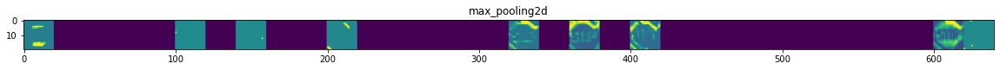

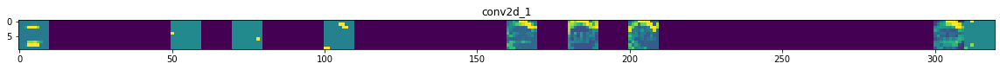

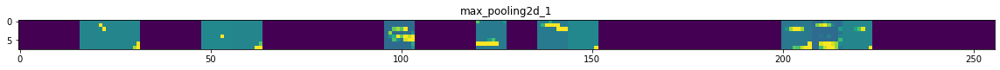

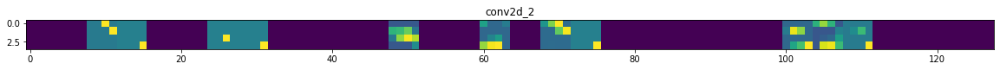

In [43]:
plot_feature_maps(masci_model, img)


In [44]:
explainer = shap.GradientExplainer(masci_model, X)
# we explain the model's predictions on the first three samples of the test set
shap_values = explainer.shap_values(to_explain)

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


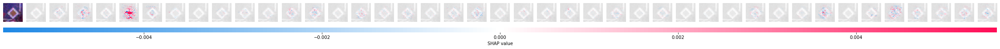

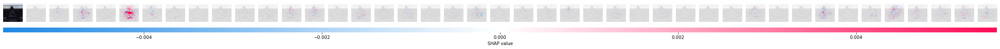

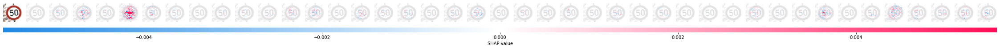

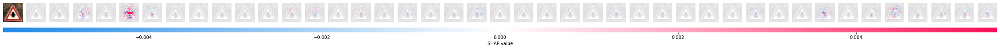

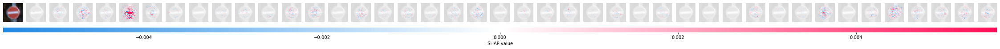

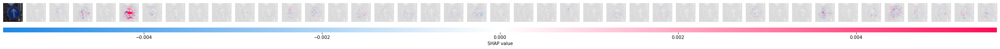

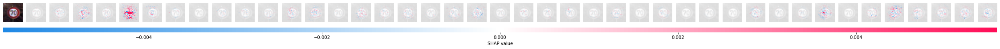

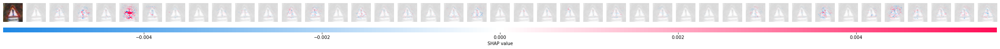

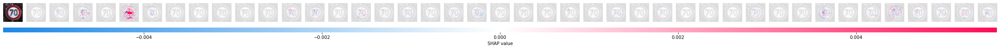

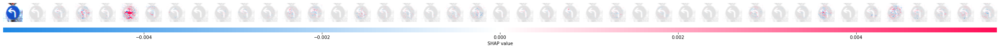

[None, None, None, None, None, None, None, None, None, None]

In [45]:
# here we plot the explanations for all classes for the first input (this is the feed forward input)
[shap.image_plot([shap_values[i][0] for i in range(42)], img, width=40) for img in to_explain]


In [46]:
run.finish()

acc,▁▁▁▁▂▃▄▄▄▄▅▅▅▆▆▆▆▇▆▇▆▇▇▇▇██▇▇█▇▇████████
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
f1_score,▁▁▁▁▁▃▄▄▄▄▅▅▅▆▆▆▆▇▆▇▆▇▇▇▇██▇▇██▇████████
loss,██▇▇▇▆▅▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁
time-elapsed,▁
val_acc,▁▁▁▁▂▃▄▄▅▄▅▅▆▅▆▆▆▆▆▇▇▇▇▇▇▇█▇▇▇▇▇████████
val_f1_score,▁▁▁▁▂▃▄▄▅▄▅▅▆▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇█▇▇████████
val_loss,▇▇▇█▆▅▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁
acc,0.81094
best_epoch,61
best_val_loss,1.07084


## Small Scale Model

Refference: Chaudhari (et, al) "Traffic Sign Recognition Using Small-Scale Convolutional Neural Network"

In [47]:
lwm_model = Sequential()
# MLP - input layer
lwm_model.add(Conv2D(filters=32, kernel_size = (3, 3), strides = (1,1), activation = relu, padding = 'valid', input_shape=(img_width, img_height, 3)))
lwm_model.add(Conv2D(filters=32, kernel_size = (3, 3), strides = (1,1), activation = relu, padding = 'valid'))
lwm_model.add(MaxPooling2D(pool_size=(2, 2)))
lwm_model.add(Dropout(0.25))
lwm_model.add(Conv2D(filters=32, kernel_size = (3, 3), strides = (1,1), activation = relu, padding = 'valid'))
lwm_model.add(MaxPooling2D(pool_size=(2, 2)))
lwm_model.add(Dropout(0.25))
# MLP layer
lwm_model.add(Flatten())
lwm_model.add(Dense(units=256, activation=relu))
lwm_model.add(Dropout(0.25))
lwm_model.add(Dense(units=43, activation=softmax))


# Check built model:
lwm_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 46, 46, 32)        896       
                                                                 
 conv2d_4 (Conv2D)           (None, 44, 44, 32)        9248      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 22, 22, 32)       0         
 2D)                                                             
                                                                 
 dropout (Dropout)           (None, 22, 22, 32)        0         
                                                                 
 conv2d_5 (Conv2D)           (None, 20, 20, 32)        9248      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 10, 10, 32)       0         
 2D)                                                  

In [48]:
# Common attributes:
# mlops
mlops_config = {
    "batch_size": batch_size,
    "img_width": img_width,
    "img_height": img_height,
    "cat_num": cat_num,
    "class_weights": True
}

mlops_config['steps_per_epoch'] = 10
mlops_config['epochs'] = 1000
mlops_config['validation_steps'] = 20
mlops_config['loss'] = 'categorical_crossentropy'
mlops_config['optimizer'] = 'adam'
mlops_config['metrics'] = ['acc', 'f1']
mlops_config['learning_rate'] = 0.01


In [49]:
# adding f1-score
from tensorflow.keras import optimizers 
import tensorflow_addons as tfa 

f1 = tfa.metrics.F1Score(num_classes=cat_num, average='weighted' or 'macro' or 'samples')

# adding a tunned Adam optimizer with learning rate = 0.001 as a tunnable HYP
opt = Adam(learning_rate=0.01)

masci_model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['acc', f1])

In [50]:
from tensorflow.keras import optimizers 

lwm_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc', f1 ])

In [51]:
from tensorflow.keras.callbacks import EarlyStopping

mlops_config['patience'] = 10
early_stopping = EarlyStopping (patience=mlops_config['patience'], monitor='val_loss', mode='min', restore_best_weights=True)

In [52]:
# MLOps init and callback
run_id = 'TS_lwm' + str(datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
wandb.init(name=run_id , project='CNN_TS', config=mlops_config)

start = timeit.default_timer()

history_lwm_model = lwm_model.fit(
    train_generator,
    steps_per_epoch=mlops_config['steps_per_epoch'],
    validation_data=val_generator,
    validation_steps=mlops_config['validation_steps'],
    epochs=mlops_config['epochs'],
    class_weight=class_weights,
    callbacks=[WandbCallback(),early_stopping])

stop = timeit.default_timer()
print('Time Elapsed: ', stop - start)
wandb.log({'time-elapsed': stop - start})

No supported GPU was found.


Epoch 1/1000
10/10 [==============================] - 37s 4s/step - loss: 3.7076 - acc: 0.0184 - f1_score: 0.0138 - val_loss: 3.7288 - val_acc: 0.0469 - val_f1_score: 0.0277
Epoch 2/1000
10/10 [==============================] - 38s 4s/step - loss: 3.6513 - acc: 0.0555 - f1_score: 0.0377 - val_loss: 3.5563 - val_acc: 0.1029 - val_f1_score: 0.0561
Epoch 3/1000
10/10 [==============================] - 35s 4s/step - loss: 3.5196 - acc: 0.0755 - f1_score: 0.0632 - val_loss: 3.4386 - val_acc: 0.0863 - val_f1_score: 0.0630
Epoch 4/1000
10/10 [==============================] - 36s 4s/step - loss: 3.1589 - acc: 0.1305 - f1_score: 0.1250 - val_loss: 3.0581 - val_acc: 0.1682 - val_f1_score: 0.1548
Epoch 5/1000
10/10 [==============================] - 34s 4s/step - loss: 2.8873 - acc: 0.1855 - f1_score: 0.1787 - val_loss: 2.9109 - val_acc: 0.1738 - val_f1_score: 0.1713
Epoch 6/1000
10/10 [==============================] - 39s 4s/step - loss: 2.7606 - acc: 0.2254 - f1_score: 0.2178 - val_loss: 2.75

In [ ]:
plot_results(history_lwm_model)

In [ ]:
# predictions on Test data

Y_pred = lwm_model.predict(test_generator, steps=len(test_generator))
y_pred = np.argmax(Y_pred, axis=1)

# Confusion Matrix
cm = confusion_matrix(test_generator.classes, y_pred)

fig, ax = plt.subplots(figsize=(20, 20))
plot_confusion_matrix(cm=cm, classes=list(classes.values()), title='Confusion Matrix')

In [ ]:
from sklearn import metrics
print(metrics.classification_report(y_pred, test_generator.classes, target_names=list(classes.values())))

In [ ]:
#uploading artifacts to MLOps
fig.savefig('./confusion_matrix.png')
report = metrics.classification_report(y_pred, test_generator.classes, target_names=list(classes.values()), output_dict=True)
report = pd.DataFrame(report).T
df_report = wandb.Table(data=report)

artifact = wandb.Artifact(run_id, type='Confusion Matrix', description='Test Results')
artifact.add_file('confusion_matrix.png')
artifact.add(df_report, name='Test F1 Scores')
run.log_artifact(artifact)

In [ ]:
# plotting feature maps
img = get_input_img(14, img_width, img_height, 30, 'Test')
print ('Shape before entering the conv layer:', img.shape)

In [ ]:
plot_feature_maps(lwm_model, img)

In [ ]:
explainer = shap.GradientExplainer(lwm_model, X)
# we explain the model's predictions on the first three samples of the test set
shap_values = explainer.shap_values(to_explain)

In [ ]:
# here we plot the explanations for all classes for the first input (this is the feed forward input)
[shap.image_plot([shap_values[i][0] for i in range(42)], img, width=40) for img in to_explain]

In [ ]:
run.finish()

### Improving on LWM

In [ ]:
lwm_model2 = Sequential()
# MLP - input layer
lwm_model2.add(Conv2D(filters=8, kernel_size = (5, 5), strides = (1,1), activation = relu, padding = 'valid', input_shape=(img_width, img_height, 3)))
lwm_model2.add(Conv2D(filters=16, kernel_size = (5, 5), strides = (1,1), activation = relu, padding = 'valid'))
lwm_model2.add(MaxPooling2D(pool_size=(2, 2)))
lwm_model2.add(Conv2D(filters=16, kernel_size = (5, 5), strides = (1,1), activation = relu, padding = 'valid'))
lwm_model2.add(Conv2D(filters=32, kernel_size = (5, 5), strides = (1,1), activation = relu, padding = 'valid'))
lwm_model2.add(MaxPooling2D(pool_size=(2, 2)))
lwm_model2.add(Conv2D(filters=32, kernel_size = (3, 3), strides = (1,1), activation = relu, padding = 'valid'))
lwm_model2.add(Conv2D(filters=64, kernel_size = (3, 3), strides = (1,1), activation = relu, padding = 'valid'))
lwm_model2.add(MaxPooling2D(pool_size=(2, 2)))
lwm_model2.add(Dropout(0.25))
# MLP layer
lwm_model2.add(Flatten())
lwm_model2.add(Dense(units=256, activation=relu))
lwm_model2.add(Dropout(0.25))
lwm_model2.add(Dense(units=43, activation=softmax))


# Check built model:
lwm_model2.summary()

In [ ]:
# adding f1-score
from tensorflow.keras import optimizers 
import tensorflow_addons as tfa 

f1 = tfa.metrics.F1Score(num_classes=cat_num, average='weighted' or 'macro' or 'samples')

# adding a tunned Adam optimizer with learning rate = 0.001 as a tunnable HYP
opt = Adam(learning_rate=0.01)

lwm_model2.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['acc', f1])

In [ ]:
# Common attributes:
# mlops
mlops_config = {
    "batch_size": batch_size,
    "img_width": img_width,
    "img_height": img_height,
    "cat_num": cat_num,
    "class_weights": True
}

mlops_config['steps_per_epoch'] = 5
mlops_config['epochs'] = 50
mlops_config['validation_steps'] = 20
mlops_config['loss'] = 'categorical_crossentropy'
mlops_config['optimizer'] = 'adam'
mlops_config['learning_rate'] = 0.01,
mlops_config['metrics'] = ['acc', f1]

In [ ]:
from tensorflow.keras import optimizers 

lwm_model2.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc', f1 ])

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

mlops_config['patience'] = 10
early_stopping = EarlyStopping (patience=mlops_config['patience'], monitor='val_loss', mode='min', restore_best_weights=True)

In [ ]:
# MLOps init and callback
wandb.init(name='CNN_TS_lwm2_b256_e50_DA_CW' , project='CNN_TS', config=mlops_config)

start = timeit.default_timer()

history_lwm2_model = lwm_model2.fit(
    train_generator,
    steps_per_epoch=mlops_config['steps_per_epoch'],
    validation_data=val_generator,
    validation_steps=mlops_config['validation_steps'],
    epochs=mlops_config['epochs'],
    class_weight=class_weights,
    callbacks=[WandbCallback(),early_stopping])

stop = timeit.default_timer()
print('Time Elapsed: ', stop - start)
wandb.log({'time-elapsed': stop - start})

wandb.finish()

In [ ]:
plot_results(history_lwm2_model)

In [ ]:
# predictions on Test data

Y_pred = lwm_model2.predict(test_generator, steps=len(test_generator))
y_pred = np.argmax(Y_pred, axis=1)

# Confusion Matrix
cm = confusion_matrix(test_generator.classes, y_pred)

fig, ax = plt.subplots(figsize=(20, 20))
plot_confusion_matrix(cm=cm, classes=list(classes.values()), title='Confusion Matrix')

In [ ]:
from sklearn import metrics
print(metrics.classification_report(y_pred, test_generator.classes, target_names=list(classes.values())))

In [ ]:
# plotting feature maps
img = get_input_img(14, img_width, img_height, 3, 'Test')
print ('Shape before entering the conv layer:', img.shape)

In [ ]:
plot_feature_maps(lwm_model2, img)

### Model 3

In [ ]:
lwm_model3 = Sequential()
# MLP - input layer
lwm_model3.add(Conv2D(filters=32, kernel_size = (5, 5), strides = (1,1), activation = relu, padding = 'valid', input_shape=(img_width, img_height, 3)))
lwm_model3.add(Conv2D(filters=64, kernel_size = (5, 5), strides = (1,1), activation = relu, padding = 'valid'))
lwm_model3.add(MaxPooling2D(pool_size=(2, 2)))
lwm_model3.add(Dropout(0.25))
lwm_model3.add(Conv2D(filters=64, kernel_size = (5, 5), strides = (1,1), activation = relu, padding = 'valid'))
lwm_model3.add(Conv2D(filters=64, kernel_size = (5, 5), strides = (1,1), activation = relu, padding = 'valid'))
lwm_model3.add(MaxPooling2D(pool_size=(2, 2)))
lwm_model3.add(Dropout(0.25))
lwm_model3.add(Conv2D(filters=64, kernel_size = (5, 5), strides = (1,1), activation = relu, padding = 'valid'))
lwm_model3.add(MaxPooling2D(pool_size=(2, 2)))
# MLP layer
lwm_model3.add(Flatten())
lwm_model3.add(Dense(units=1024, activation=relu))
lwm_model3.add(Dropout(0.25))
lwm_model3.add(Dense(units=512, activation=relu))
lwm_model3.add(Dropout(0.25))
lwm_model3.add(Dense(units=43, activation=softmax))


# Check built model:
lwm_model3.summary()

In [ ]:
# adding f1-score
from tensorflow.keras import optimizers 
import tensorflow_addons as tfa 

f1 = tfa.metrics.F1Score(num_classes=cat_num, average='weighted' or 'macro' or 'samples')

# adding a tunned Adam optimizer with learning rate = 0.001 as a tunnable HYP
opt = Adam(learning_rate=0.01)

lwm_model3.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['acc', f1])

In [ ]:
# Common attributes:
# mlops
mlops_config = {
    "batch_size": batch_size,
    "img_width": img_width,
    "img_height": img_height,
    "cat_num": cat_num,
    "class_weights": True
}

mlops_config['steps_per_epoch'] = 5
mlops_config['epochs'] = 50
mlops_config['validation_steps'] = 20
mlops_config['loss'] = 'categorical_crossentropy'
mlops_config['optimizer'] = 'adam'
mlops_config['learning_rate'] = 0.01,
mlops_config['metrics'] = ['acc', f1]

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

mlops_config['patience'] = 30
early_stopping = EarlyStopping (patience=mlops_config['patience'], monitor='val_loss', mode='min', restore_best_weights=True)

In [ ]:
# MLOps init and callback
wandb.init(name='CNN_TS_lwm3_b256_e50_DA_CW' , project='CNN_TS', config=mlops_config)

start = timeit.default_timer()

history_lwm_model3 = lwm_model3.fit(
    train_generator,
    steps_per_epoch=mlops_config['steps_per_epoch'],
    validation_data=val_generator,
    validation_steps=mlops_config['validation_steps'],
    epochs=mlops_config['epochs'],
    class_weight=class_weights,
    callbacks=[WandbCallback(),early_stopping])

stop = timeit.default_timer()
print('Time Elapsed: ', stop - start)
wandb.log({'time-elapsed': stop - start})

wandb.finish()

In [ ]:
plot_results(history_lwm_model3)

In [ ]:
# predictions on Test data

Y_pred = lwm_model3.predict(test_generator, steps=len(test_generator))
y_pred = np.argmax(Y_pred, axis=1)

# Confusion Matrix
cm = confusion_matrix(test_generator.classes, y_pred)

fig, ax = plt.subplots(figsize=(20, 20))
plot_confusion_matrix(cm=cm, classes=list(classes.values()), title='Confusion Matrix')

In [ ]:
from sklearn import metrics
print(metrics.classification_report(y_pred, test_generator.classes, target_names=list(classes.values())))

In [ ]:
# plotting feature maps
img = get_input_img(14, img_width, img_height, 3, 'Test')
print ('Shape before entering the conv layer:', img.shape)

In [ ]:
plot_feature_maps(lwm_model3, img)

## miniVGGNet


In [53]:
chanDim = -1
miniVGGmodel = Sequential()
# MLP - input layer
miniVGGmodel.add(Conv2D(8, (5, 5), activation = relu, padding="same", input_shape=(img_width, img_height, 3)))
miniVGGmodel.add(BatchNormalization(axis=chanDim))
miniVGGmodel.add(MaxPooling2D(pool_size=(2, 2)))

miniVGGmodel.add(Conv2D(16, (3, 3), activation = relu, padding="same"))
miniVGGmodel.add(BatchNormalization(axis=chanDim))
miniVGGmodel.add(Conv2D(16, (3, 3), activation = relu, padding="same"))
miniVGGmodel.add(BatchNormalization(axis=chanDim))
miniVGGmodel.add(MaxPooling2D(pool_size=(2, 2)))

# first set of FC => RELU layers
miniVGGmodel.add(Flatten())
miniVGGmodel.add(Dense(units=128, activation=relu))
miniVGGmodel.add(BatchNormalization())
miniVGGmodel.add(Dropout(0.5))

miniVGGmodel.add(Flatten())
miniVGGmodel.add(Dense(units=128, activation=relu))
miniVGGmodel.add(BatchNormalization())
miniVGGmodel.add(Dropout(0.5))

miniVGGmodel.add(Dense(units=cat_num, activation=softmax))

# Check built model:
miniVGGmodel.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 48, 48, 8)         608       
                                                                 
 batch_normalization (BatchN  (None, 48, 48, 8)        32        
 ormalization)                                                   
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 24, 24, 8)        0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 24, 24, 16)        1168      
                                                                 
 batch_normalization_1 (Batc  (None, 24, 24, 16)       64        
 hNormalization)                                                 
                                                      

In [57]:
# adding f1-score
from tensorflow.keras import optimizers 
import tensorflow_addons as tfa 

f1 = tfa.metrics.F1Score(num_classes=cat_num, average='weighted' or 'macro' or 'samples')

# adding a tunned Adam optimizer with learning rate = 0.001 as a tunnable HYP
opt = Adam(learning_rate=0.01)

miniVGGmodel.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['acc', f1])

In [58]:
# Common attributes:
# mlops
mlops_config = {
    "batch_size": batch_size,
    "img_width": img_width,
    "img_height": img_height,
    "cat_num": cat_num,
    "class_weights": True
}

mlops_config['steps_per_epoch'] = 5
mlops_config['epochs'] = 300
mlops_config['validation_steps'] = 20
mlops_config['loss'] = 'categorical_crossentropy'
mlops_config['optimizer'] = 'adam'
mlops_config['learning_rate'] = 0.01,
mlops_config['metrics'] = ['acc', f1]

In [59]:
from tensorflow.keras.callbacks import EarlyStopping

mlops_config['patience'] = 30
early_stopping = EarlyStopping (patience=mlops_config['patience'], monitor='val_loss', mode='min', restore_best_weights=True)

In [60]:
# MLOps init and callback
run_id = 'TS_miniVGG' + str(datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
wandb.init(name=run_id , project='CNN_TS', config=mlops_config)

start = timeit.default_timer()

history_miniVGGmodel = miniVGGmodel.fit(
    train_generator,
    steps_per_epoch=mlops_config['steps_per_epoch'],
    validation_data=val_generator,
    validation_steps=mlops_config['validation_steps'],
    epochs=mlops_config['epochs'],
    class_weight=class_weights,
    callbacks=[WandbCallback(),early_stopping])

stop = timeit.default_timer()
print('Time Elapsed: ', stop - start)
wandb.log({'time-elapsed': stop - start})


acc,▁▁▂▃▃▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇█▇▇█████████
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
f1_score,▁▁▂▃▃▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇█▇▇█████████
loss,██▇▆▅▅▅▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
time-elapsed,▁
val_acc,▁▂▂▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇█▇█▇█████████
val_f1_score,▁▁▂▃▄▄▄▄▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇█▇█▇█████████
val_loss,██▆▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
acc,0.80742
best_epoch,60
best_val_loss,1.10119


No supported GPU was found.
Epoch 1/300
5/5 [==============================] - 33s 8s/step - loss: 5.0420 - acc: 0.0273 - f1_score: 0.0293 - val_loss: 4.5333 - val_acc: 0.0578 - val_f1_score: 0.0096
Epoch 2/300
5/5 [==============================] - 24s 6s/step - loss: 3.9236 - acc: 0.0555 - f1_score: 0.0575 - val_loss: 4.7661 - val_acc: 0.0623 - val_f1_score: 0.0169
Epoch 3/300
5/5 [==============================] - 21s 5s/step - loss: 3.9100 - acc: 0.0836 - f1_score: 0.0784 - val_loss: 7.4002 - val_acc: 0.0402 - val_f1_score: 0.0102
Epoch 4/300
5/5 [==============================] - 21s 5s/step - loss: 3.4859 - acc: 0.0875 - f1_score: 0.0867 - val_loss: 8.5789 - val_acc: 0.0258 - val_f1_score: 0.0057
Epoch 5/300
5/5 [==============================] - 20s 5s/step - loss: 3.5088 - acc: 0.0977 - f1_score: 0.0915 - val_loss: 10.8968 - val_acc: 0.0211 - val_f1_score: 0.0047
Epoch 6/300
5/5 [==============================] - 19s 4s/step - loss: 3.1613 - acc: 0.1070 - f1_score: 0.1102 - val

color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.


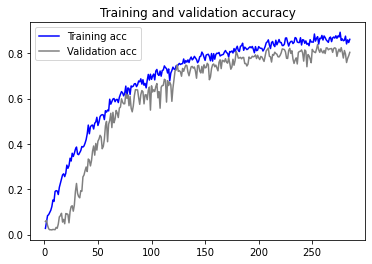

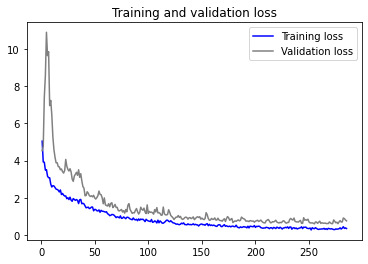

In [61]:
plot_results(history_miniVGGmodel)

Confusion matrix, without normalization
[[ 28   5   0 ...   0   0   0]
 [  2 690   0 ...   5   1   0]
 [  0   0 646 ...   0   0   0]
 ...
 [  0   2   0 ... 378  52   0]
 [  1   5   0 ...   9 406   0]
 [  0   0   5 ...   0   2 463]]


<module 'matplotlib.pyplot' from '/usr/local/Caskroom/miniforge/base/envs/tf-macos/lib/python3.8/site-packages/matplotlib/pyplot.py'>

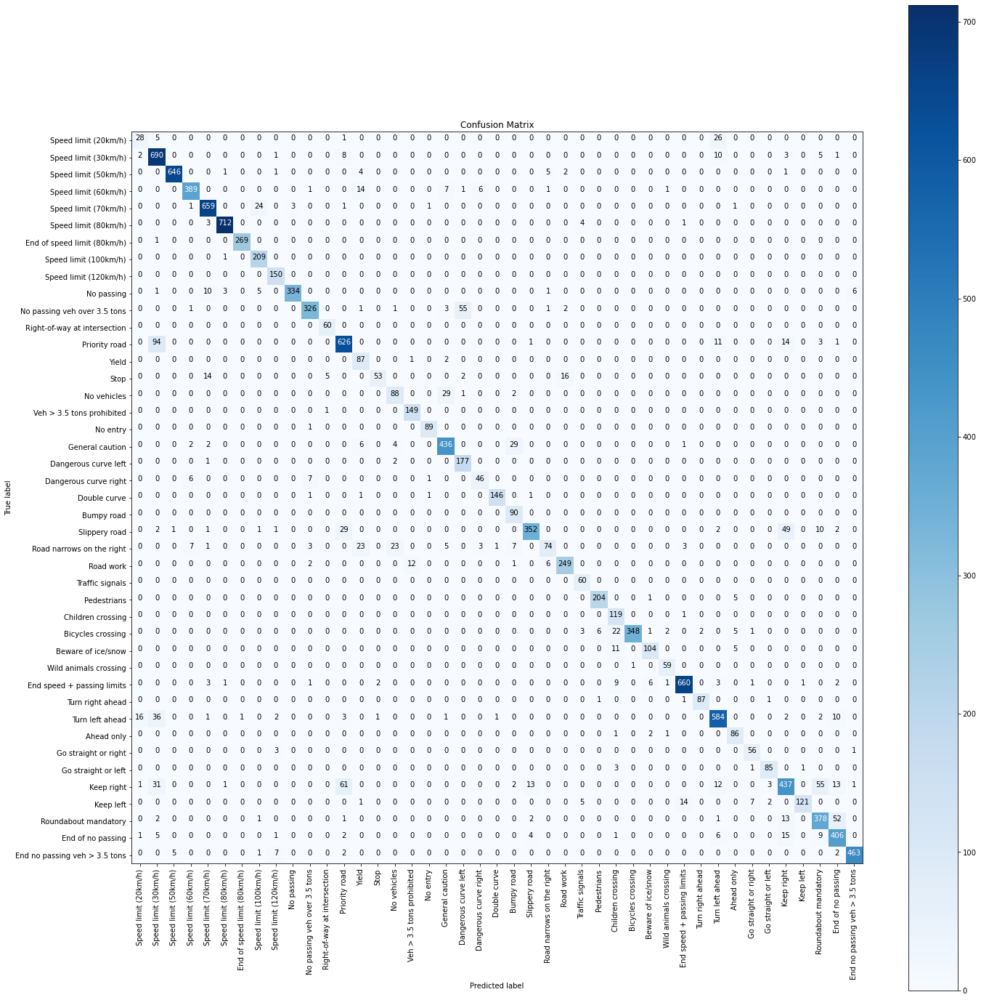

In [62]:
# predictions on Test data

Y_pred = miniVGGmodel.predict(test_generator, steps=len(test_generator))
y_pred = np.argmax(Y_pred, axis=1)

# Confusion Matrix
cm = confusion_matrix(test_generator.classes, y_pred)

fig, ax = plt.subplots(figsize=(20, 20))
plot_confusion_matrix(cm=cm, classes=list(classes.values()), title='Confusion Matrix')

In [63]:
from sklearn import metrics
print(metrics.classification_report(y_pred, test_generator.classes, target_names=list(classes.values())))

                               precision    recall  f1-score   support

         Speed limit (20km/h)       0.47      0.58      0.52        48
         Speed limit (30km/h)       0.96      0.80      0.87       867
         Speed limit (50km/h)       0.98      0.99      0.98       652
         Speed limit (60km/h)       0.93      0.96      0.94       406
         Speed limit (70km/h)       0.96      0.95      0.95       695
         Speed limit (80km/h)       0.99      0.99      0.99       719
  End of speed limit (80km/h)       1.00      1.00      1.00       270
        Speed limit (100km/h)       1.00      0.87      0.93       241
        Speed limit (120km/h)       1.00      0.90      0.95       166
                   No passing       0.93      0.99      0.96       337
 No passing veh over 3.5 tons       0.84      0.95      0.89       342
 Right-of-way at intersection       1.00      0.91      0.95        66
                Priority road       0.83      0.85      0.84       734
     

In [64]:
#uploading artifacts to MLOps
fig.savefig('./confusion_matrix.png')
report = metrics.classification_report(y_pred, test_generator.classes, target_names=list(classes.values()), output_dict=True)
report = pd.DataFrame(report).T
df_report = wandb.Table(data=report)

artifact = wandb.Artifact(run_id, type='Confusion Matrix', description='Test Results')
artifact.add_file('confusion_matrix.png')
artifact.add(df_report, name='Test F1 Scores')
run.log_artifact(artifact)

Exception: The wandb backend process has shutdown

Shape before entering the conv layer: (1, 48, 48, 3)


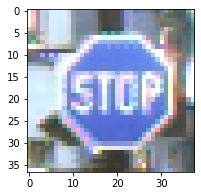

In [65]:
# plotting feature maps
img = get_input_img(14, img_width, img_height, 3, 'Test')
print ('Shape before entering the conv layer:', img.shape)

(1, 48, 48, 8)
(1, 24, 24, 8)
(1, 24, 24, 16)
(1, 24, 24, 16)
(1, 24, 24, 16)
(1, 24, 24, 16)
(1, 12, 12, 16)
(1, 2304)
(1, 128)
(1, 128)
(1, 128)
(1, 128)
(1, 128)
(1, 128)
(1, 128)
(1, 43)


invalid value encountered in true_divide
divide by zero encountered in true_divide


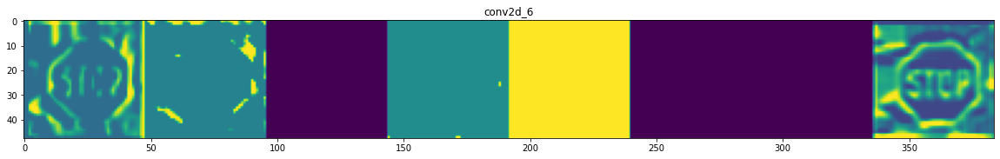

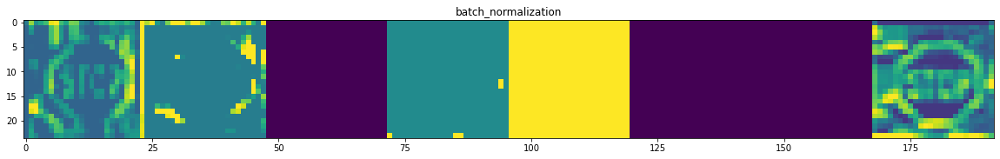

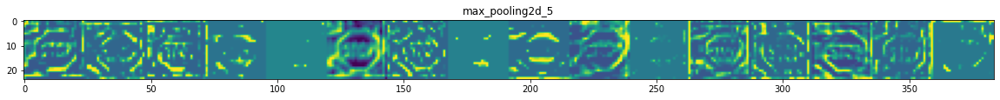

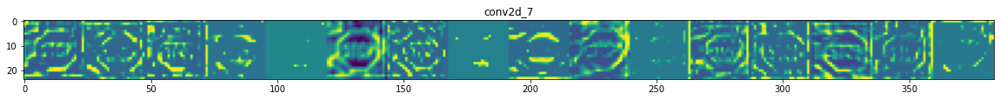

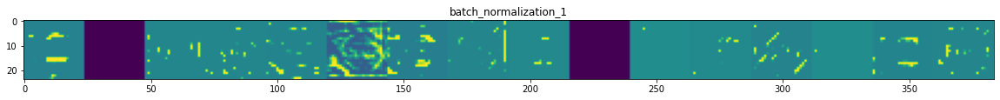

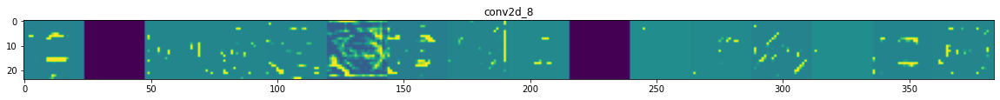

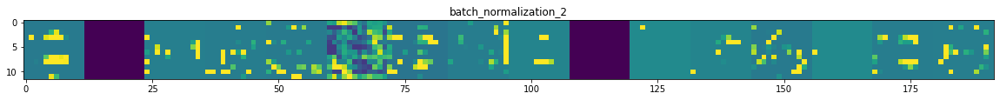

In [66]:
plot_feature_maps(miniVGGmodel, img)

8


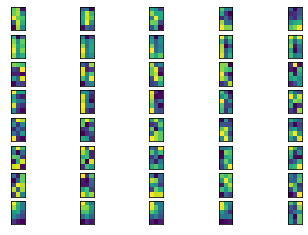

16


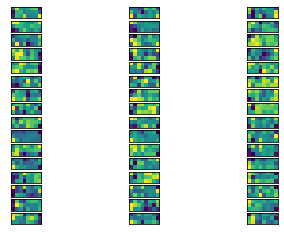

16


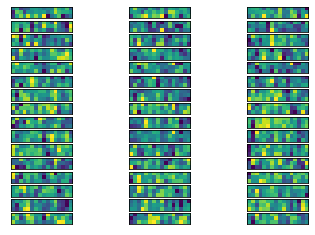

In [67]:
show_filters(miniVGGmodel)

In [68]:
explainer = shap.GradientExplainer(miniVGGmodel, X)
# we explain the model's predictions on the first three samples of the test set
shap_values = explainer.shap_values(to_explain)

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


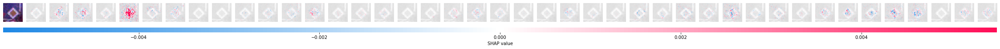

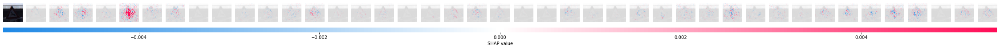

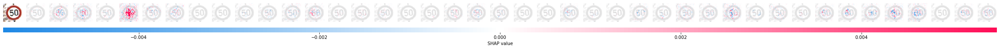

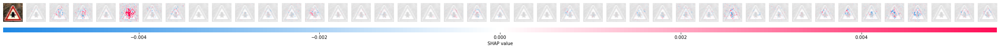

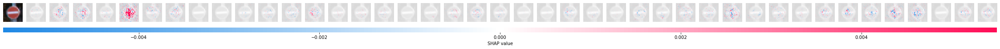

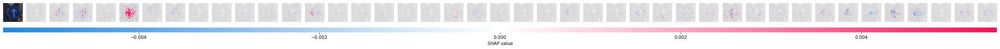

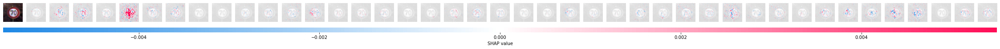

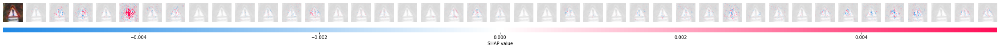

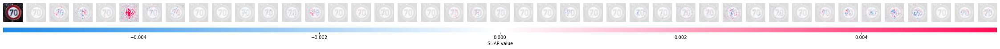

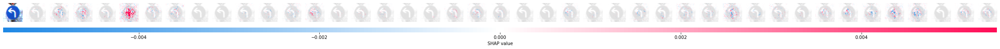

[None, None, None, None, None, None, None, None, None, None]

In [69]:
# here we plot the explanations for all classes for the first input (this is the feed forward input)
[shap.image_plot([shap_values[i][0] for i in range(42)], img, width=40) for img in to_explain]

In [70]:
run.finish()

In [71]:
wandb.finish()

# 